# Computer Vision Basics with openCV

### Import statements

In [2]:
import numpy as np
import pandas as pd
import cv2 as cv2
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

### Check your openCV version

In [ ]:
cv2.__version__

'4.1.2'

## Computer Vision Basics

### Load and Image

In [ ]:
!ls ../street.jpg

bin	 datalab  home	 lib64	opt   run   street.jpg	       tmp    var
boot	 dev	  lib	 media	proc  sbin  sys		       tools
content  etc	  lib32  mnt	root  srv   tensorflow-1.15.2  usr


In [ ]:
# Declare a variable with the path to your image
path = "../street.jpg"

In [ ]:
# Load the image with openCV
img = cv2.imread(path)

[Hint](# "You will need to use cv2.imread")

### Check the image type

In [ ]:
# What is the image type? -> type
type(img)

numpy.ndarray

[Hint](# "Just use the python type function")

In [ ]:
# Print the value of the pixels of the image
print(img)

[[[  9  53  17]
  [  8  61  22]
  [ 22  95  49]
  ...
  [204 151  47]
  [204 146  43]
  [204 147  42]]

 [[  7  46  14]
  [  7  55  19]
  [ 21  87  45]
  ...
  [204 150  49]
  [203 148  44]
  [205 148  43]]

 [[  0  27   0]
  [  0  27   0]
  [  0  44   5]
  ...
  [205 150  51]
  [205 149  48]
  [205 150  46]]

 ...

 [[119 167 215]
  [109 157 205]
  [ 89 137 185]
  ...
  [183 176 173]
  [184 177 174]
  [164 157 154]]

 [[ 89 137 185]
  [ 88 136 184]
  [ 82 130 178]
  ...
  [201 192 188]
  [154 148 143]
  [105  99  94]]

 [[ 90 138 186]
  [ 93 141 189]
  [ 82 130 178]
  ...
  [212 204 197]
  [168 162 157]
  [104  98  93]]]


[Hint](# "Just use the python print function")

### Show the image using openCV

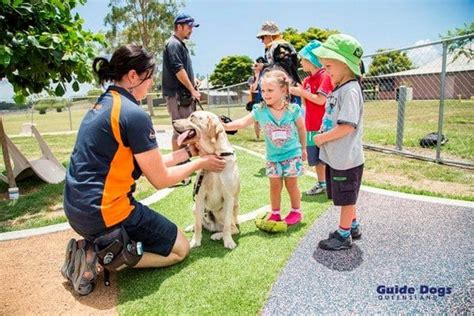

-1

In [ ]:
# Lets now see the image! dont forget to call destroyAllWindows!
cv2_imshow(img)  # name for image is the ‘window’, image variable
cv2.waitKey(0) # wait for key to be pressed # 0 is wait forever until I press a key, orput in milisecond until show anyway even without key press
cv2.destroyAllWindows()
cv2.waitKey(1) #fixes the crash

[Hint](# "You need to use imshow, waitkey and destroyAllWindows")

### Now lets display unsing matplotlib

In [ ]:
# Import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

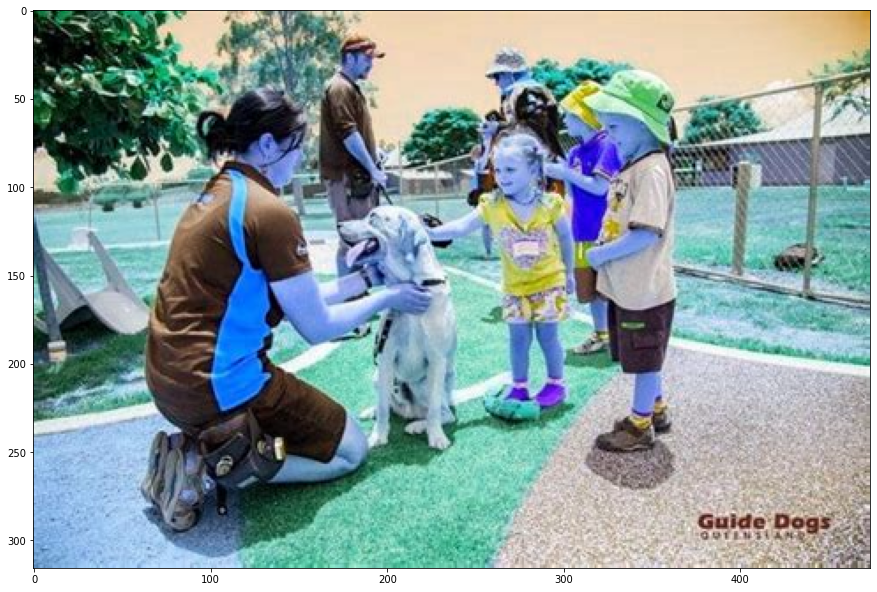

In [ ]:
# Choose a pyplot figsize to make images fit nicely into the notebook
plt.figure(figsize=(15,15))

# Now display the image with plt
plt.imshow(img);

### Lets fix the colors

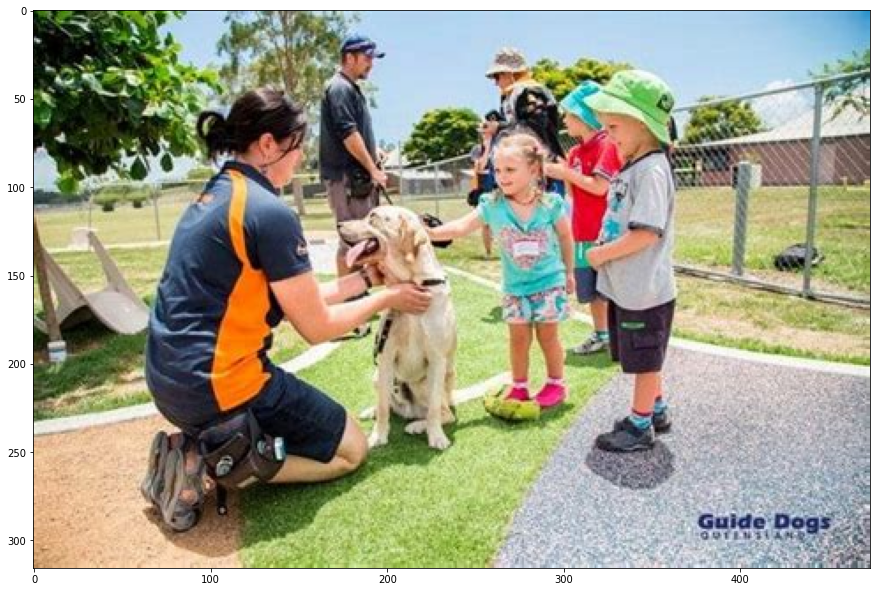

In [ ]:
# Does your image look ok? are the colors the right ones?, if not, lets fix it!
# Remember that openCV will load images using BGR rather than RGB
# Change the image to RGB and diplay it again with plt
plt.figure(figsize=(15,15))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)   #convert color
plt.imshow(rgb_img);

[Hint](# "use cvtColor") 

### What is the shape of the image?

In [ ]:
# Check the image shape
rgb_img.shape

(316, 474, 3)

### Lets make it grayscale

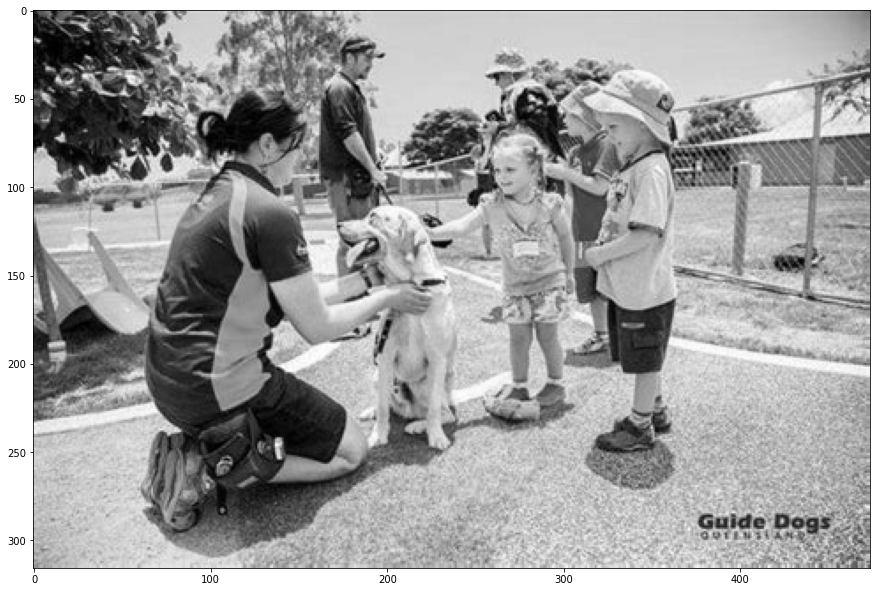

In [ ]:
# Load the the image in grayscale, what are the 2 ways you can do that?
plt.figure(figsize=(15,15))
grayscale_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #converts to grayscale
plt.imshow(grayscale_img, cmap="gray");

In [ ]:
# Now load an image in color and then transform it to grayscale
img2 = cv2.imread("../street2.jpg")
grayscale_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

### What is the shape now?

In [ ]:
# Check the grayscale shape
grayscale_img2.shape

(315, 474)

### How does it look like?

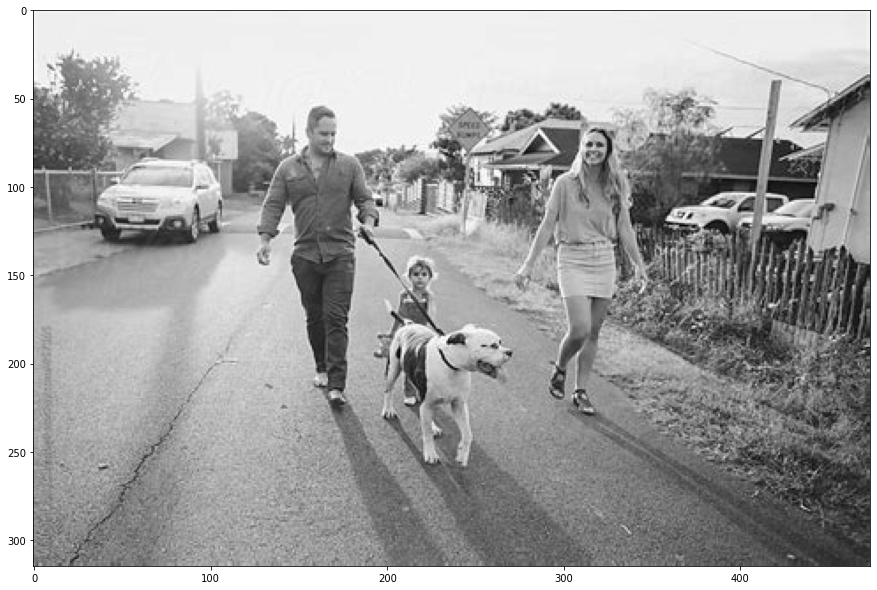

In [ ]:
# Display the grayscale image with matplotlib, how does it look?
plt.figure(figsize=(15,15))
plt.imshow(grayscale_img2, cmap="gray");

### Cropping an image

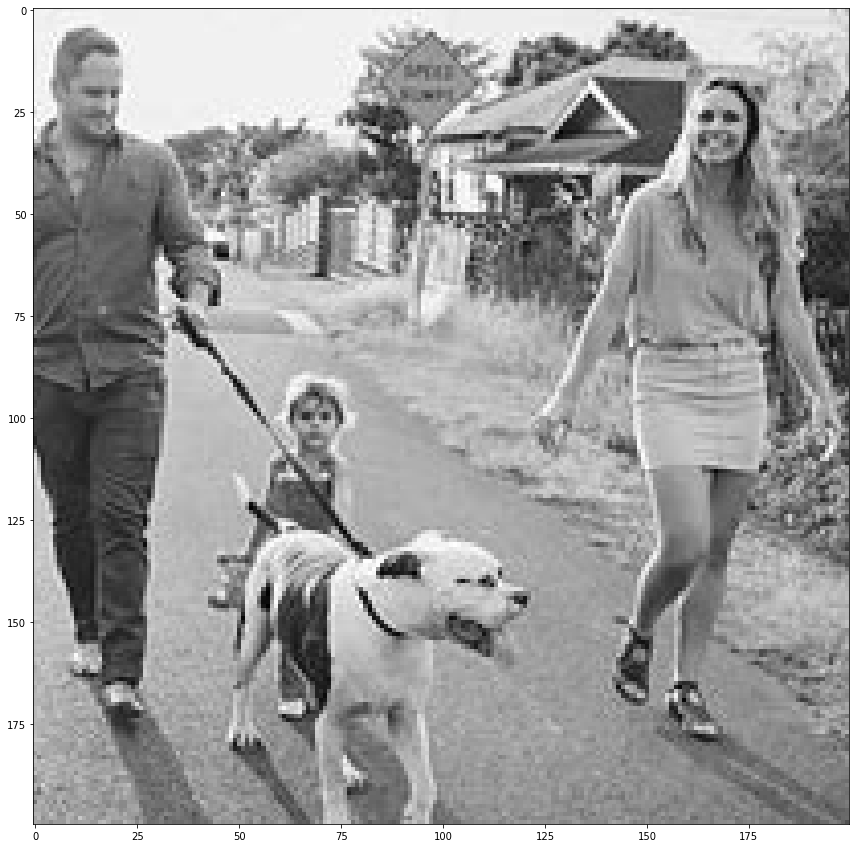

In [ ]:
# Lets now crop a Region of Interest of an image, load an image and crop different parts of it
cropped_img = grayscale_img2[50:250, 150:350]
plt.figure(figsize=(15,15))
plt.imshow(cropped_img, cmap="gray");

In [ ]:
# Save to disk the cropped areas
cv2.imwrite("../cropped.jpg", cropped_img)

True

### To edit an image making a copy of it is always a good idea!

In [ ]:
# Load an image and then make a copy of it
img3 = cv2.imread("../beach.jpg")
img_copy = img3.copy()

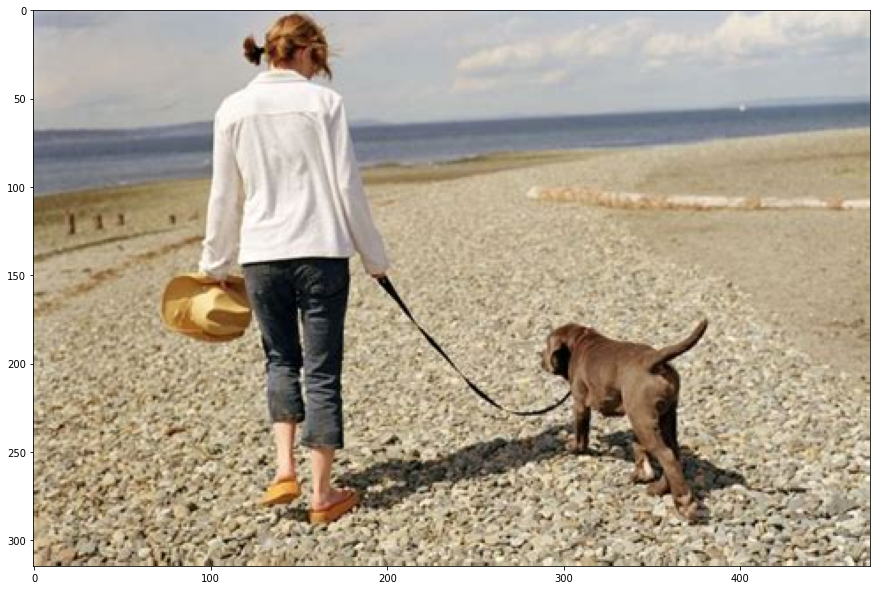

In [ ]:
plt.figure(figsize=(15,15))
img_copy = cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB)   #convert color
plt.imshow(img_copy);

[Hint](# "use the numpy function ") 

## Annotating images

### Rectangles

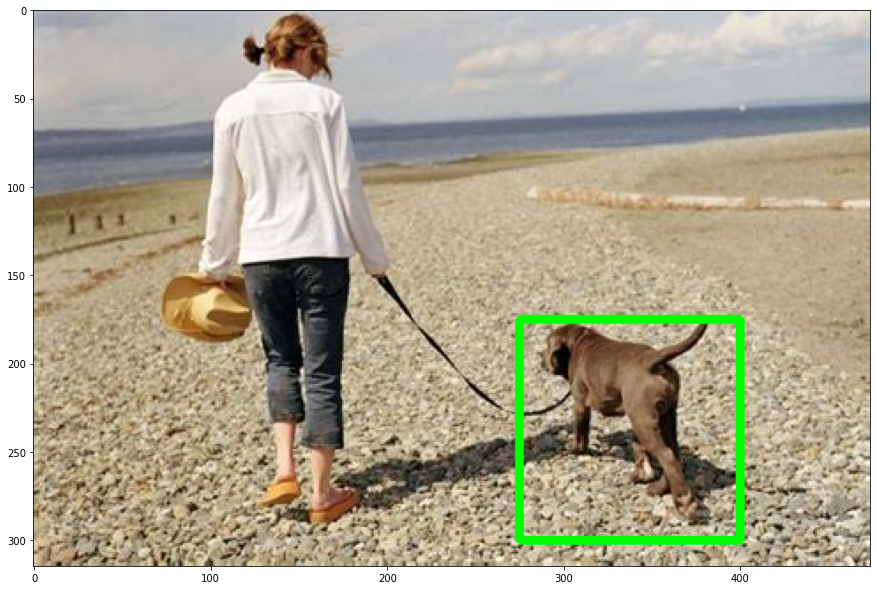

In [ ]:
# Draw green rectangle on top of a region of interest in your image
plt.figure(figsize=(15,15))
cv2.rectangle(img_copy, (400, 300), (275, 175), color=(0,255,0), thickness=3)
plt.imshow(img_copy);

[Hint](# "You will need to use the cv2 function rectangle(img, pt1, pt2, color, thickness) -> img") 

### Adding text to images

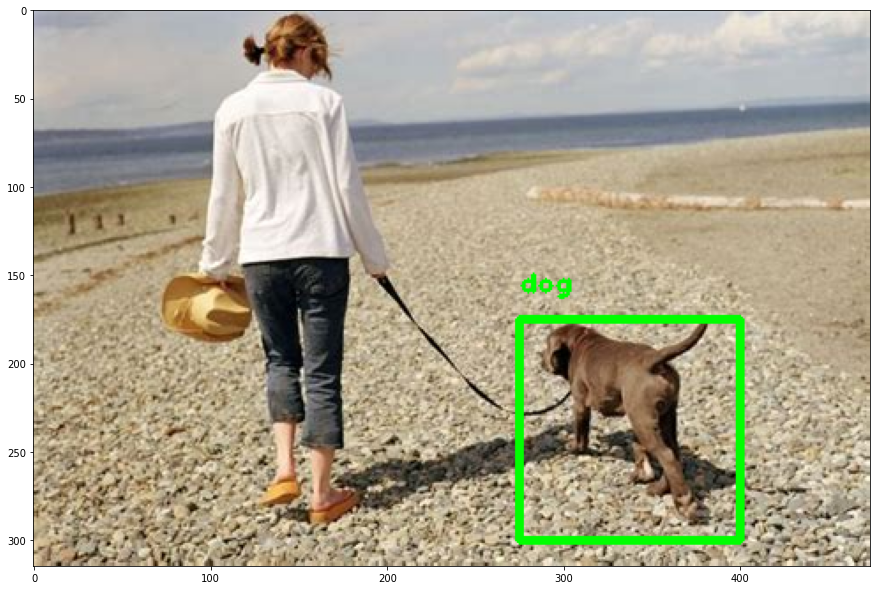

In [ ]:
# Make a copy of your image and then write some text on top of the image
img_copy2 = img_copy.copy()
cv2.putText(img_copy2, fontFace=cv2.FONT_HERSHEY_PLAIN, text="dog", org=(275,160), fontScale=1, color=(0,255,0), thickness=2, )
plt.figure(figsize=(15,15))
plt.imshow(img_copy2);

[Hint](# "You will need to use cv2 putText function -> putText(img, text, coordinates, fontFace, fontScale, color, thickness, lineType). For fonts check the enum cv2.FONT_HERSHEY_") 

Now that you know how to load annotate and save images lets start manually annotating some images

![](annotations.jpg)

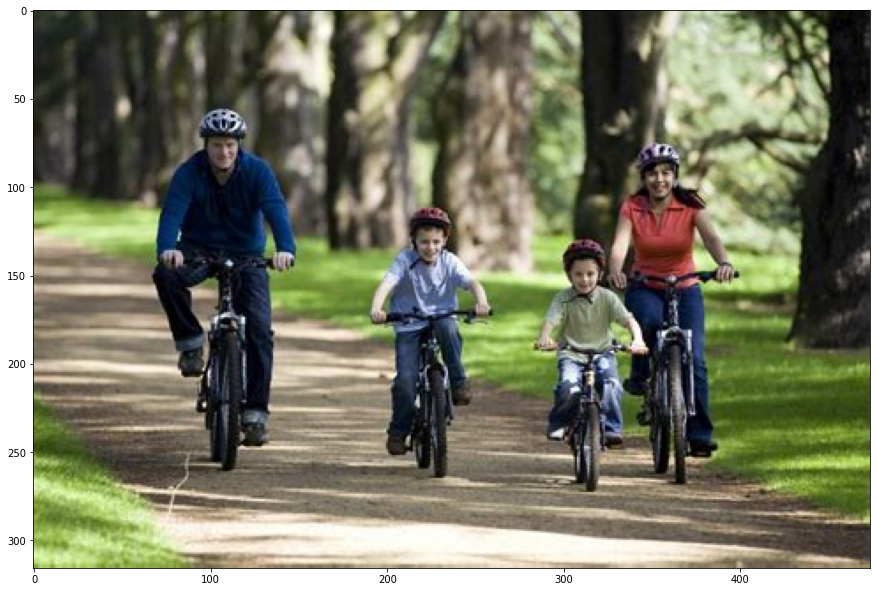

In [ ]:
# Load as many images as you like and start annotating objects in the image, 
# Before annotating the images make a copy of the image so we keep the original without changes
# Use the format proposed in the example above
img4 = cv2.imread("../bikes.jpg")
img_copy4 = img4.copy()
img_copy4 = cv2.cvtColor(img_copy4, cv2.COLOR_BGR2RGB)   #convert color
plt.figure(figsize=(15,15))
plt.imshow(img_copy4);

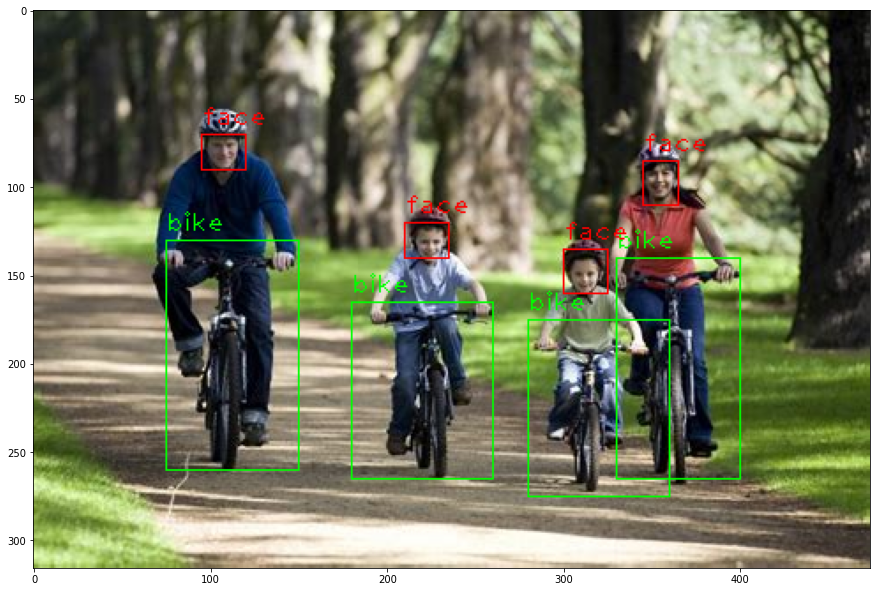

In [ ]:
#bikes
cv2.rectangle(img_copy4, (150, 260), (75, 130), color=(0,255,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="bike", org=(75,125), fontScale=1, color=(0,255,0), thickness=1) # add text

cv2.rectangle(img_copy4, (260, 265), (180, 165), color=(0,255,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="bike", org=(180,160), fontScale=1, color=(0,255,0), thickness=1) # add text

cv2.rectangle(img_copy4, (360, 275), (280, 175), color=(0,255,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="bike", org=(280,170), fontScale=1, color=(0,255,0), thickness=1) # add text

cv2.rectangle(img_copy4, (400, 265), (330, 140), color=(0,255,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="bike", org=(330,135), fontScale=1, color=(0,255,0), thickness=1) # add text

#faces
cv2.rectangle(img_copy4, (120, 90), (95, 70), color=(255,0,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="face", org=(95,65), fontScale=1, color=(255,0,0), thickness=1) # add text

cv2.rectangle(img_copy4, (235, 140), (210, 120), color=(255,0,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="face", org=(210,115), fontScale=1, color=(255,0,0), thickness=1) # add text

cv2.rectangle(img_copy4, (325, 160), (300, 135), color=(255,0,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="face", org=(300,130), fontScale=1, color=(255,0,0), thickness=1) # add text

cv2.rectangle(img_copy4, (365, 110), (345, 85), color=(255,0,0), thickness=1)  # add rectangle
cv2.putText(img_copy4, fontFace=cv2.FONT_HERSHEY_PLAIN, text="face", org=(345,80), fontScale=1, color=(255,0,0), thickness=1) # add text

plt.figure(figsize=(15,15))
plt.imshow(img_copy4);

In [ ]:
img_copy4 = cv2.cvtColor(img_copy4, cv2.COLOR_BGR2RGB)
cv2.imwrite("../bikes_boxes.jpg", img_copy4)

True

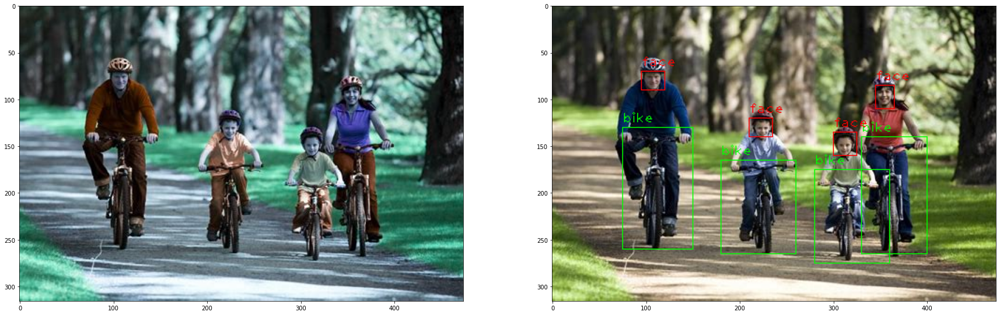

In [ ]:
# Display the images that you have annotated above, both versions, the original one and the annotated one
fig, ax = plt.subplots(1,2, figsize=(30, 30))
ax[0].imshow(img4)
ax[1].imshow(img_copy4);

# Mini Projects

With all that you accomplished to do above you are now ready to do your first mini project!, you might need to learn some more new things to accomplish some of the harder levels below, it is very important to get used to the openCV docs 

## Meme creator

### Level 1
1. Create a basic Meme creator with one image and a short line of text, using any openCV font

### Level 2
1. Use the classic meme font (impact)

### Level 3
1. Improve it by adding 2 to 3 lines with the text on the top of the image and the bottom of the image
1. Make the text in white and with black contours

### Level 4
1. Make the text center automatically [Hint](# "getTextSize") 
1. If the text is too long it should wrap the text in as many lines as needed



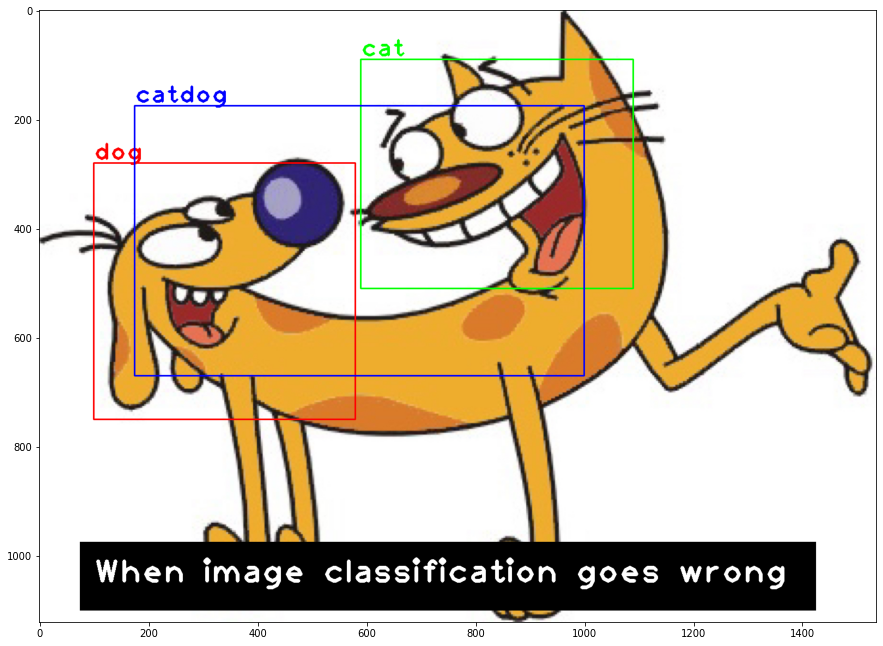

In [ ]:
# Level 1
# Create a basic Meme creator with one image and a short line of text, using any openCV font
meme = cv2.imread("../catdog.jpg")
meme_copy = meme.copy()
meme_copy = cv2.cvtColor(meme_copy, cv2.COLOR_BGR2RGB)   #convert color

# dog
cv2.rectangle(meme_copy, (580, 750), (100, 280), color=(255,0,0), thickness=2)  # add rectangle
cv2.putText(meme_copy, fontFace=cv2.FONT_HERSHEY_PLAIN, text="dog", org=(100,275), fontScale=3, color=(255,0,0), thickness=3) # add text

# cat
cv2.rectangle(meme_copy, (1090, 510), (590, 90), color=(0,255, 0), thickness=2, lineType=cv2.LINE_4)  # add rectangle
cv2.putText(meme_copy, fontFace=cv2.FONT_HERSHEY_PLAIN, text="cat", org=(590,85), fontScale=3, color=(0,255,0), thickness=3) # add text

#catdog
cv2.rectangle(meme_copy, (1000, 670), (175, 175), color=(0,0,255), thickness=2, lineType=cv2.LINE_4)  # add rectangle
cv2.putText(meme_copy, fontFace=cv2.FONT_HERSHEY_PLAIN, text="catdog", org=(175,170), fontScale=3, color=(0,0,255), thickness=3) # add text

#meme text
cv2.rectangle(meme_copy, (1425,1100), (75,975), color=(0,0,0), thickness=-1)
cv2.putText(meme_copy, fontFace=cv2.FONT_HERSHEY_PLAIN, text="When image classification goes wrong", org=(100,1050), fontScale=4, color=(255,255,255), thickness=6) # add text

plt.figure(figsize=(15,15))
plt.imshow(meme_copy);

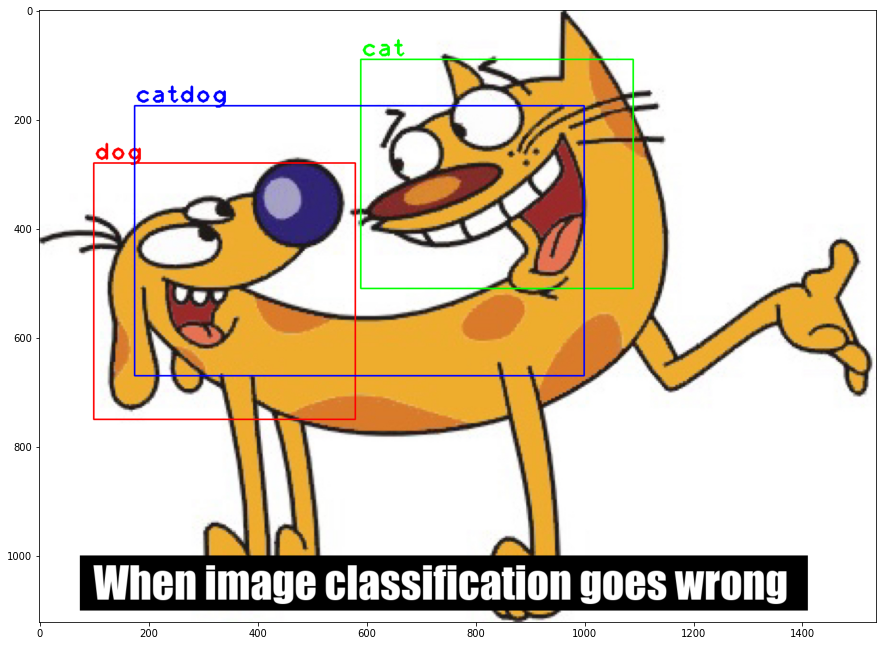

In [ ]:
from PIL import ImageFont, ImageDraw, Image

 # Load image in OpenCV  
image = cv2.imread("../catdog.jpg")
meme_copy2 = image.copy()
meme_copy2 = cv2.cvtColor(meme_copy2, cv2.COLOR_BGR2RGB)   #convert color

# make black box for text
cv2.rectangle(meme_copy2, (1410,1100), (75,1000), color=(0,0,0), thickness=-1)

#meme text
text_to_show = "When image classification goes wrong"
# Pass the image to PIL  
pil_im = Image.fromarray(meme_copy2)  
draw = ImageDraw.Draw(pil_im)  
# use a truetype font  
font = ImageFont.truetype("../impact.ttf", 80)  
# Draw the text  
draw.text((100, 1000), text_to_show, font=font, fill=(255,255,255))  
# Get back the image to OpenCV  
meme_copy2 = np.array(pil_im)


# dog
cv2.rectangle(meme_copy2, (580, 750), (100, 280), color=(255,0,0), thickness=2)  # add rectangle
cv2.putText(meme_copy2, fontFace=cv2.FONT_HERSHEY_PLAIN, text="dog", org=(100,275), fontScale=3, color=(255,0,0), thickness=3) # add text

# cat
cv2.rectangle(meme_copy2, (1090, 510), (590, 90), color=(0,255, 0), thickness=2, lineType=cv2.LINE_4)  # add rectangle
cv2.putText(meme_copy2, fontFace=cv2.FONT_HERSHEY_PLAIN, text="cat", org=(590,85), fontScale=3, color=(0,255,0), thickness=3) # add text

#catdog
cv2.rectangle(meme_copy2, (1000, 670), (175, 175), color=(0,0,255), thickness=2, lineType=cv2.LINE_4)  # add rectangle
cv2.putText(meme_copy2, fontFace=cv2.FONT_HERSHEY_PLAIN, text="catdog", org=(175,170), fontScale=3, color=(0,0,255), thickness=3) # add text

plt.figure(figsize=(15,15))
plt.imshow(meme_copy2);

In [ ]:
meme_copy2 = cv2.cvtColor(meme_copy2, cv2.COLOR_BGR2RGB)
cv2.imwrite("../catdog_meme.jpg", meme_copy2)

True

In [4]:
!ls

sample_data  trump4.jpg


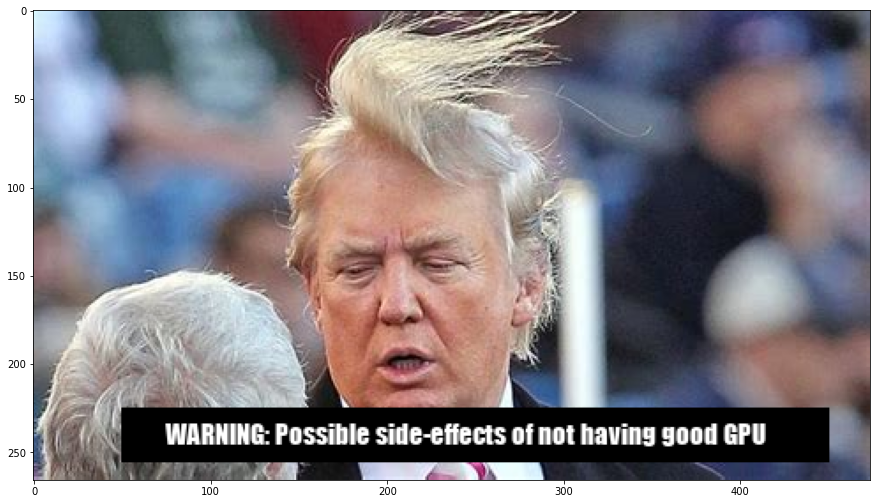

In [20]:
from PIL import ImageFont, ImageDraw, Image

 # Load image in OpenCV  
image = cv2.imread("trump4.jpg")
meme_trump = image.copy()
meme_trump = cv2.cvtColor(meme_trump, cv2.COLOR_BGR2RGB)   #convert color

# make black box for text
cv2.rectangle(meme_trump, (450,255), (50,225), color=(0,0,0), thickness=-1)

#meme text
text1 = "WARNING: Possible side-effects of not having good GPU"
# Pass the image to PIL  
pil_im = Image.fromarray(meme_trump)  
draw = ImageDraw.Draw(pil_im)  
# use a truetype font  
font = ImageFont.truetype("impact.ttf", 15)  
# Draw the text  
draw.text((75, 230), text1, font=font, fill=(255,255,255))
# Get back the image to OpenCV
meme_trump = np.array(pil_im)


plt.figure(figsize=(15,15))
plt.imshow(meme_trump);

In [21]:
meme_trump = cv2.cvtColor(meme_trump, cv2.COLOR_BGR2RGB)
cv2.imwrite("../meme_trump.jpg", meme_trump)

True

## QR Reader

### Level 1
1. Researn on the openCV docs and learn about QRCodeDetector
1. Grab any QR code from google images for example this one: ![](https://blog-trycontechnologi.netdna-ssl.com/blog/qrbatch/wp-content/uploads/sites/7/2019/07/ID-Card-with-QR-Code-2-1.png) or any other. 
1. Detect the code using QRCodeDetector
1. Print QR detected if a QR has been detected in the image

### Level 2
1. Decode and print the decoded text
1. Draw a rectangle around the QR code that has been detected and show it on screen
1. Save the QR region of the image to disk


In [ ]:
qrcode = cv2.imread("../qrcode2.jpg")
qrcode_copy = qrcode.copy()
qrcode_copy = cv2.cvtColor(qrcode_copy, cv2.COLOR_BGR2RGB)
qrDecoder = cv2.QRCodeDetector()

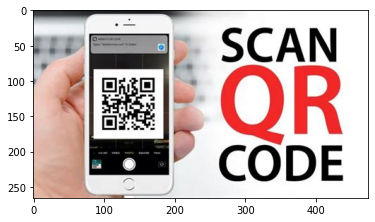

In [ ]:
plt.imshow(qrcode_copy);

In [ ]:
# Detect and decode the qrcode
data,bbox,rectifiedImage = qrDecoder.detectAndDecode(qrcode_copy)

In [ ]:
bbox

array([[[ 98.,  96.]],

       [[171.,  96.]],

       [[171., 169.]],

       [[ 98., 169.]]], dtype=float32)

QR detected!
Decoded Data : http://doitdummy.com


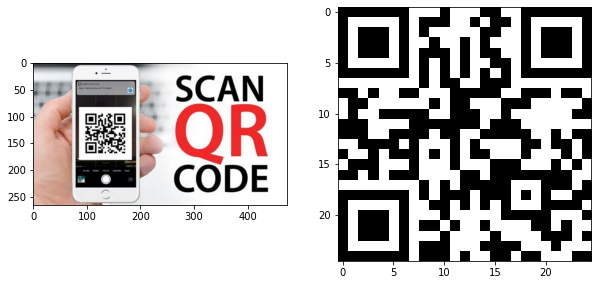

In [ ]:
if len(data)>0:
  print("QR detected!")
  print("Decoded Data : {}".format(data))
  rectifiedImage = np.uint8(rectifiedImage)
  rectifiedImage = cv2.cvtColor(rectifiedImage, cv2.COLOR_BGR2RGB)
  fig, ax = plt.subplots(1,2, figsize=(10, 10))
  ax[0].imshow(qrcode_copy)
  ax[1].imshow(rectifiedImage)
else:
  print("QR Code not detected")
  plt.imshow(qrcode_copy);

## Make into function

In [ ]:
def detect_qrcode(image_path):
  qrcode = cv2.imread(image_path)
  qrcode_copy = qrcode.copy()
  qrcode_copy = cv2.cvtColor(qrcode_copy, cv2.COLOR_BGR2RGB)
  qrDecoder = cv2.QRCodeDetector()

  # Detect and decode the qrcode
  data, bbox, rectifiedImage = qrDecoder.detectAndDecode(qrcode_copy)

  if len(data)>0:
    print("QR detected!")
    print("Decoded Data : {}".format(data))
    rectifiedImage = np.uint8(rectifiedImage)
    rectifiedImage = cv2.cvtColor(rectifiedImage, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(1,2, figsize=(10, 10))
    ax[0].imshow(qrcode_copy)
    ax[1].imshow(rectifiedImage) 
  else:
    print("QR Code not detected")
    plt.imshow(qrcode_copy);

QR Code not detected


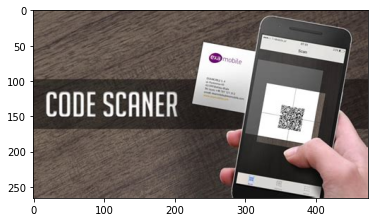

In [ ]:
detect_qrcode("../qrcode3.jpg")

QR detected!
Decoded Data : HTTP://M.GMSX.CO/3290/KKU7Q


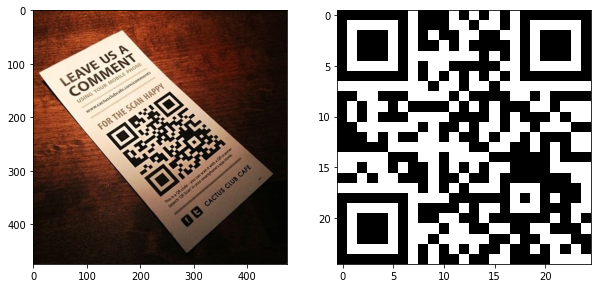

In [ ]:
detect_qrcode("../qrcode5.jpg")

QR detected!
Decoded Data : http://visualcod.es


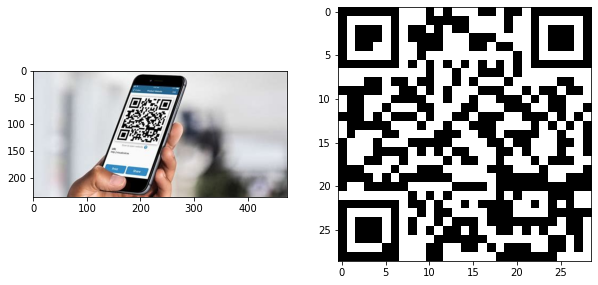

In [ ]:
detect_qrcode("../qrcode6.jpg")

QR detected!
Decoded Data : http://bit.ly/opNBrQ?r=qr


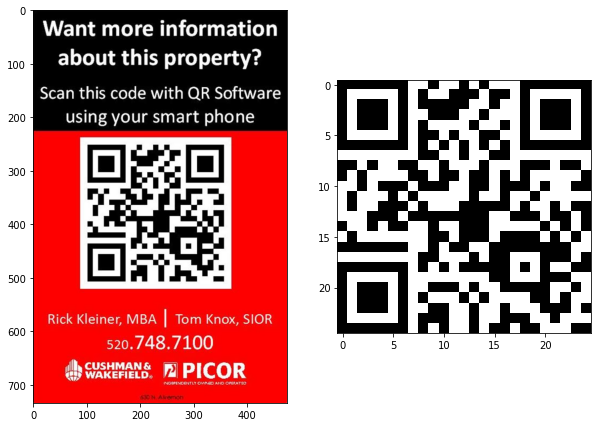

In [ ]:
detect_qrcode("../qrcode7.jpg")